<h1 style="text-align:center">Rain in Australia<h1>

<div>
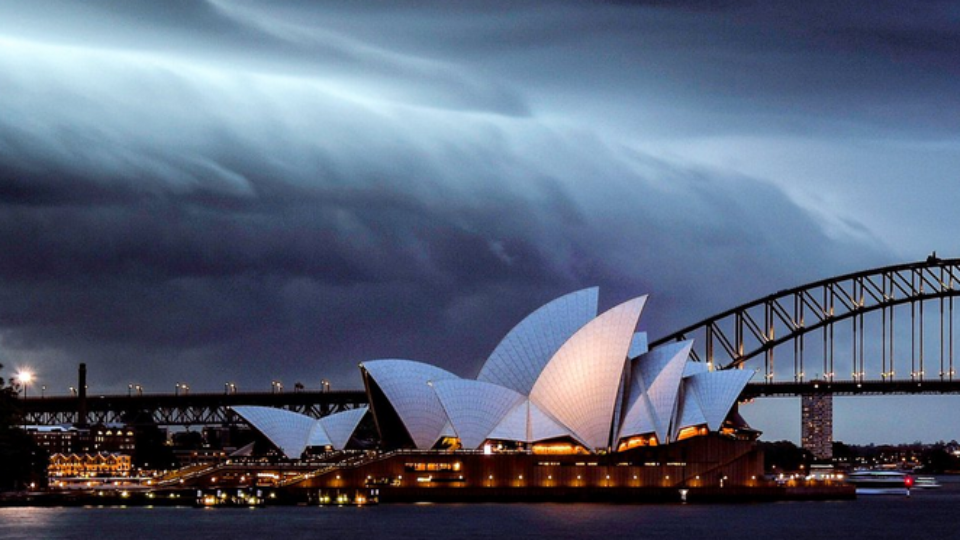
</div>
    
### Context
Predict next-day rain by training classification models on the target variable RainTomorrow.

### Content
This dataset contains about 10 years of daily weather observations from many locations across Australia.

* RainTomorrow is the target variable to predict. Did it rain the next day, Yes or No? 
* RainTomorrow column is Yes if the rain for that day was 1mm or more.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import LabelEncoder
import folium
from folium.plugins import HeatMapWithTime

In [2]:
df = pd.read_csv('data/weatherAUS.csv')

In [3]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [4]:
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [6]:
def display_col_info(df):
    zeros_cnt = df.isnull().sum().sort_values(ascending=True)
    zero_count = df.isnull().sum() / df.isnull().count()
    percent_zeros = (zero_count).sort_values(ascending=False)
    missing_data = pd.concat([zeros_cnt, percent_zeros],
                             axis=1,
                             keys=['Total', 'Percent'])
    print(missing_data)

In [7]:
display_col_info(df)

               Total   Percent
Date               0  0.000000
Location           0  0.000000
MaxTemp         1261  0.008669
MinTemp         1485  0.010209
Temp9am         1767  0.012148
WindSpeed9am    1767  0.012148
Humidity9am     2654  0.018246
WindSpeed3pm    3062  0.021050
Rainfall        3261  0.022419
RainToday       3261  0.022419
RainTomorrow    3267  0.022460
Temp3pm         3609  0.024811
WindDir3pm      4228  0.029066
Humidity3pm     4507  0.030984
WindGustSpeed  10263  0.070555
WindGustDir    10326  0.070989
WindDir9am     10566  0.072639
Pressure3pm    15028  0.103314
Pressure9am    15065  0.103568
Cloud9am       55888  0.384216
Cloud3pm       59358  0.408071
Evaporation    62790  0.431665
Sunshine       69835  0.480098


In [8]:
unq_vals = pd.DataFrame()
cols = []
unique_count = []
for col in df.columns:
    unique_count.append(df[col].nunique())
    cols.append(col)

unq_vals["columns"] = cols
unq_vals["unique_count"] = unique_count
unq_vals

,columns,unique_count
0,Date,3436
1,Location,49
2,MinTemp,389
3,MaxTemp,505
4,Rainfall,681
5,Evaporation,358
6,Sunshine,145
7,WindGustDir,16
8,WindGustSpeed,67
9,WindDir9am,16


## Data Preprocessing

#### Handling Categorical Columns

In [9]:
category_obj = (df.dtypes == "object")
category_cols = list(category_obj[category_obj].index)
print(f"Categorical Columns: {category_cols}")

Categorical Columns: ['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


In [10]:
for col in category_cols:
    df[col].fillna(df[col].mode()[0], inplace=True)

#### Handling Numerical Columns

In [11]:
num_types = (df.dtypes == "float64")
num_cols = list(num_types[num_types].index)
print(f"Numerical Columns:\n{num_cols}")

Numerical Columns:
['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']


In [12]:
for col in num_cols:
    df[col].fillna(df[col].mean(), inplace=True)

In [13]:
display_col_info(df)

               Total  Percent
Date               0      0.0
Temp3pm            0      0.0
Temp9am            0      0.0
Cloud3pm           0      0.0
Cloud9am           0      0.0
Pressure3pm        0      0.0
Pressure9am        0      0.0
Humidity3pm        0      0.0
Humidity9am        0      0.0
WindSpeed3pm       0      0.0
RainToday          0      0.0
WindSpeed9am       0      0.0
WindDir9am         0      0.0
WindGustSpeed      0      0.0
WindGustDir        0      0.0
Sunshine           0      0.0
Evaporation        0      0.0
Rainfall           0      0.0
MaxTemp            0      0.0
MinTemp            0      0.0
Location           0      0.0
WindDir3pm         0      0.0
RainTomorrow       0      0.0


In [14]:
df.head(5)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,5.468232,7.611178,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.000000,4.50993,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,5.468232,7.611178,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,4.447461,4.50993,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,5.468232,7.611178,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,4.447461,2.00000,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,5.468232,7.611178,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,4.447461,4.50993,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,5.468232,7.611178,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.000000,8.00000,17.8,29.7,No,No


In [15]:
aus_df = df.copy(deep=True)

In [16]:
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [17]:
df['Date'] = pd.to_datetime(df['Date'])

In [18]:
df['Location'] = pd.Categorical(df['Location'])
df['WindGustDir'] = pd.Categorical(df['WindGustDir'])
df['WindDir9am'] = pd.Categorical(df['WindDir9am'])
df['RainToday'] = pd.Categorical(df['RainToday'])
df['RainTomorrow'] = pd.Categorical(df['RainTomorrow'])
df['RainToday'] = pd.Categorical(df['RainToday'])

In [19]:
labelencoder = LabelEncoder()
df['Location_cat'] = labelencoder.fit_transform(df['Location'])

In [20]:
labelencoder = LabelEncoder()
df['WindGustDir_cat'] = labelencoder.fit_transform(df['WindGustDir'])

In [21]:
labelencoder = LabelEncoder()
df['WindDir9am_cat'] = labelencoder.fit_transform(df['WindDir9am'])

In [22]:
labelencoder = LabelEncoder()
df['RainToday_cat'] = labelencoder.fit_transform(df['RainToday'])

In [23]:
labelencoder = LabelEncoder()
df['RainTomorrow_cat'] = labelencoder.fit_transform(df['RainTomorrow'])

In [24]:
labelencoder = LabelEncoder()
df['RainToday_cat'] = labelencoder.fit_transform(df['RainToday'])

In [25]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Location_cat,WindGustDir_cat,WindDir9am_cat,RainToday_cat,RainTomorrow_cat
0,2008-12-01,Albury,13.4,22.9,0.6,5.468232,7.611178,W,44.0,W,...,4.50993,16.9,21.8,No,No,2,13,13,0,0
1,2008-12-02,Albury,7.4,25.1,0.0,5.468232,7.611178,WNW,44.0,NNW,...,4.50993,17.2,24.3,No,No,2,14,6,0,0
2,2008-12-03,Albury,12.9,25.7,0.0,5.468232,7.611178,WSW,46.0,W,...,2.00000,21.0,23.2,No,No,2,15,13,0,0
3,2008-12-04,Albury,9.2,28.0,0.0,5.468232,7.611178,NE,24.0,SE,...,4.50993,18.1,26.5,No,No,2,4,9,0,0
4,2008-12-05,Albury,17.5,32.3,1.0,5.468232,7.611178,W,41.0,ENE,...,8.00000,17.8,29.7,No,No,2,13,1,0,0


## Data Visualizations

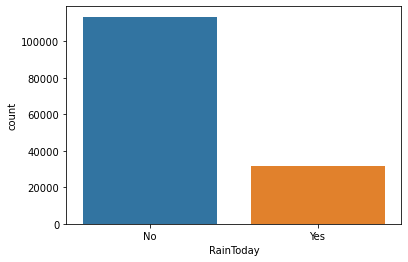

In [26]:
sns.countplot(data=df, x="RainToday")
plt.show()

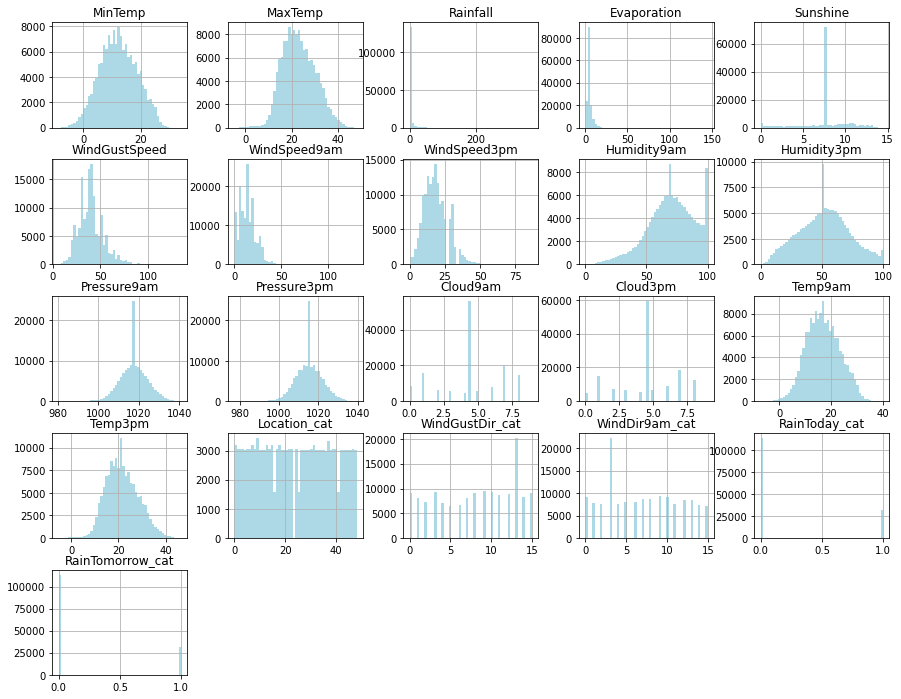

In [27]:
df.hist(bins=50, figsize=(15, 12), color='lightblue')
plt.show()

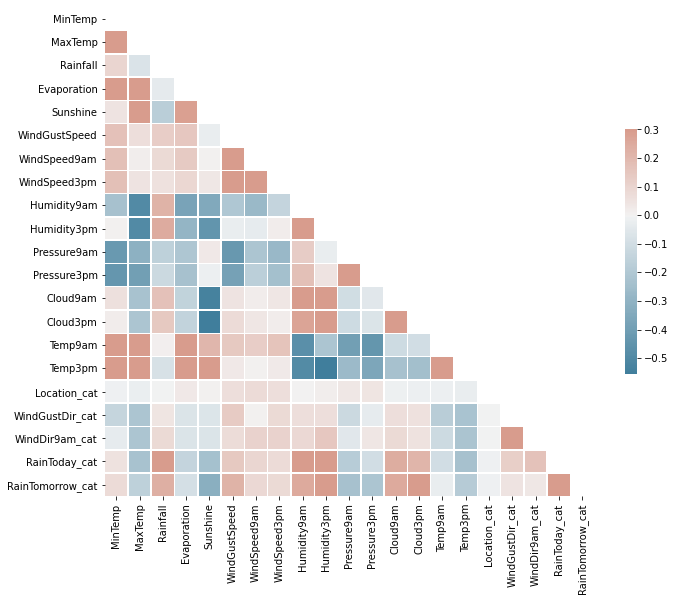

In [28]:
corr = df.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr,
            mask=mask,
            cmap=cmap,
            vmax=.3,
            center=0,
            square=True,
            linewidths=.5,
            cbar_kws={"shrink": .5})
plt.show()

In [29]:
loc_max_temp = df[["Location", "MaxTemp"]].groupby("Location").mean()
loc_max_temp.sort_values(by="MaxTemp", inplace=True)
labels = {"MaxTemp": "Maximum Temperature °C", "Location": "Location Names"}
fig = px.bar(loc_max_temp, labels=labels,
             color_discrete_sequence=['lightcoral'])
fig.show()

In [30]:
loc_min_temp = df[["Location", "MinTemp"]].groupby("Location").mean()
loc_min_temp.sort_values(by="MinTemp", inplace=True)
labels = {"MinTemp": "Minumum Temperature °C", "Location": "Location Names"}
fig = px.bar(loc_min_temp,
             labels=labels,
             color_discrete_sequence=['lightslategray'])
fig.show()

In [31]:
loc_rain = df[["Location", "Rainfall"]].groupby("Location").mean()
loc_rain.sort_values(by="Rainfall", inplace=True)
labels = {"Rainfall": "Amount of Rainfall", "Location": "Location Names"}
fig = px.bar(loc_rain, labels=labels, color_discrete_sequence=['skyblue'])
fig.show()

In [32]:
aus_cities = pd.read_csv("data/aus.csv")

In [33]:
aus_cities.head()

,city,lat,lng,country,iso2,admin_name,capital,population,population_proper
0,Sydney,-33.8650,151.2094,Australia,AU,New South Wales,admin,5312163,4840600
1,Melbourne,-37.8136,144.9631,Australia,AU,Victoria,admin,5078193,4529500
2,Brisbane,-27.4678,153.0281,Australia,AU,Queensland,admin,2514184,2360241
3,Perth,-31.9522,115.8589,Australia,AU,Western Australia,admin,2059484,2039200
4,Adelaide,-34.9289,138.6011,Australia,AU,South Australia,admin,1345777,1295714


In [34]:
def get_cities_not_found_list():
    aus_cities_list = list(set(aus_cities.city))
    datset_cities_list = list(set(aus_df.Location.unique()))
    cities_not_found = []
    for city in datset_cities_list:
        found_city = False
        for aus_city in aus_cities_list:
            if city.lower() in aus_city.lower():
                # print(f"Dataset City: {city}")
                # print(f"AusData city: {aus_city}\n")
                found_city = True
        if not found_city:
            cities_not_found.append(city)
    return cities_not_found

In [35]:
aus_df.loc[aus_df.Location == "MelbourneAirport", 'Location'] = "Melbourne"
aus_df.loc[aus_df.Location == "PerthAirport", 'Location'] = "Perth"
aus_df.loc[aus_df.Location == "SydneyAirport", 'Location'] = "Sydney"
aus_df.loc[aus_df.Location == "CoffsHarbour", 'Location'] = "Coffs Harbour"
aus_df.loc[aus_df.Location == "GoldCoast", 'Location'] = "Gold Coast"
aus_df.loc[aus_df.Location == "NorfolkIsland", 'Location'] = "New Norfolk"
aus_df.loc[aus_df.Location == "BadgerysCreek", 'Location'] = "Badger Creek"
aus_df.loc[aus_df.Location == "WaggaWagga", 'Location'] = "Wagga Wagga"
aus_df.loc[aus_df.Location == "AliceSprings", 'Location'] = "Alice Springs"
aus_df.loc[aus_df.Location == "MountGambier", 'Location'] = "Mount Gambier"

In [36]:
cities_not_found = get_cities_not_found_list()
print(cities_not_found)

['NorahHead', 'Walpole', 'Watsonia', 'MountGinini', 'Tuggeranong', 'Williamtown', 'SalmonGums', 'Dartmoor', 'PearceRAAF', 'Witchcliffe', 'Uluru', 'Woomera']


In [37]:
# NotFound: Dartmoor Tuggeranong NorahHead Woomera Witchcliffe Walpole MountGinini Uluru Watsonia PearceRAAF Williamtown

In [38]:
map_df = aus_df.merge(aus_cities, how='inner',
                      left_on='Location', right_on='city')

In [39]:
date_df = map_df.loc[map_df.Date == "2008-12-01"]

In [40]:
date_df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,RainTomorrow,city,lat,lng,country,iso2,admin_name,capital,population,population_proper
0,2008-12-01,Albury,13.400000,22.900000,0.600000,5.468232,7.611178,W,44.00000,W,...,No,Albury,-36.0806,146.9158,Australia,AU,New South Wales,NaN,47974,4804
15076,2008-12-01,Newcastle,13.200000,23.221348,0.000000,5.468232,7.611178,W,40.03523,NW,...,No,Newcastle,-32.9167,151.7500,Australia,AU,New South Wales,NaN,322278,152984
21124,2008-12-01,Penrith,15.200000,32.600000,0.000000,5.468232,7.611178,WNW,59.00000,NNE,...,No,Penrith,-33.7511,150.6942,Australia,AU,New South Wales,NaN,13295,13295
30485,2008-12-01,Sydney,17.600000,31.300000,0.000000,7.600000,10.900000,W,40.03523,ENE,...,No,Sydney,-33.8650,151.2094,Australia,AU,New South Wales,admin,5312163,4840600
39543,2008-12-01,Wollongong,12.194034,23.221348,2.360918,5.468232,7.611178,W,40.03523,N,...,No,Wollongong,-34.4331,150.8831,Australia,AU,New South Wales,NaN,302739,289236


In [41]:
date_df["Sunshine"].max()

13.2

In [42]:
aus_plot = folium.Map(location=[-26.0, 140],
                      control_scale=True,
                      zoom_start=4.3,
                      tiles="CartoDB positron")

for i in range(0, len(date_df)):
    folium.Marker(
        location=[date_df.iloc[i]['lat'], date_df.iloc[i]['lng']],
        tooltip="MinTemp: " + str(date_df.iloc[i]['MinTemp']) +
        "<br/> MaxTemp: " + str(date_df.iloc[i]['MaxTemp']),
        icon=folium.Icon(color='blue',
                         prefix="fa fas fa-cloud")).add_to(aus_plot)

aus_plot

In [43]:
import folium
sunshine_map = folium.Map(location=[-26.0, 140],
                          tiles='cartodbdark_matter',
                          zoom_start=4)

for i in range(len(date_df)):
    def color_producer(val):
        if val < 4:
            return 'yellow'
        elif val < 8:
            return 'pink'
        else:
            return 'red'
for i in range(len(date_df)):
    folium.Circle(location=[date_df.iloc[i]['lat'], date_df.iloc[i]['lng']],
                  radius=50*date_df.iloc[i]['Sunshine'],
                  popup=f"Sunshine: {date_df.iloc[i]['Sunshine']}",
                  color=color_producer(date_df.iloc[i]['Sunshine'])
                  ).add_to(sunshine_map)
sunshine_map

In [44]:
dfmap = map_df[['Date', 'lat', 'lng', 'Rainfall']]
df_day_list = []

for day in dfmap["Date"].sort_values().unique():
    data = dfmap.loc[
        dfmap["Date"] == day,
        ['Date', 'lat', 'lng', 'Rainfall']].groupby(
        ['lat', 'lng']).sum().reset_index().values.tolist()
    df_day_list.append(data)

ts_rain_map = folium.Map([-26.0, 140],
                         zoom_start=4.3,
                         tiles='CartoDB positron')
HeatMapWithTime(df_day_list,
                index=list(dfmap["Date"].sort_values().unique()),
                auto_play=False,
                radius=10,
                gradient={
                    0.2: 'lightskyblue',
                    0.4: 'skyblue',
                    0.6: 'steelblue',
                    1.0: 'darkcyan'
                },
                min_opacity=0.5,
                max_opacity=0.8,
                use_local_extrema=True).add_to(ts_rain_map)
ts_rain_map

## Classification Models

In [45]:
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

### Splitting into training and testing dataset

In [46]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'Location_cat',
       'WindGustDir_cat', 'WindDir9am_cat', 'RainToday_cat',
       'RainTomorrow_cat'],
      dtype='object')

In [47]:
train_cols = df[['Location_cat', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
                 'Sunshine', 'WindGustDir_cat', 'WindGustSpeed', 'Humidity9am',
                 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
                 'Temp9am', 'Temp3pm', 'RainToday_cat']]

In [48]:
test_cols = df[['RainTomorrow_cat']]

In [49]:
train_cols.head()

,Location_cat,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir_cat,WindGustSpeed,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday_cat
0,2,13.4,22.9,0.6,5.468232,7.611178,13,44.0,71.0,22.0,1007.7,1007.1,8.000000,4.50993,16.9,21.8,0
1,2,7.4,25.1,0.0,5.468232,7.611178,14,44.0,44.0,25.0,1010.6,1007.8,4.447461,4.50993,17.2,24.3,0
2,2,12.9,25.7,0.0,5.468232,7.611178,15,46.0,38.0,30.0,1007.6,1008.7,4.447461,2.00000,21.0,23.2,0
3,2,9.2,28.0,0.0,5.468232,7.611178,4,24.0,45.0,16.0,1017.6,1012.8,4.447461,4.50993,18.1,26.5,0
4,2,17.5,32.3,1.0,5.468232,7.611178,13,41.0,82.0,33.0,1010.8,1006.0,7.000000,8.00000,17.8,29.7,0


In [50]:
test_cols.head()

,RainTomorrow_cat
0,0
1,0
2,0
3,0
4,0


In [51]:
x_train, x_test, y_train, y_test = train_test_split(
    train_cols, test_cols, test_size=0.2)

## Logistic Regression

In [52]:
lr = LogisticRegression(random_state=66, max_iter=1000)
lr.fit(x_train, y_train.values.ravel())

LogisticRegression(max_iter=1000, random_state=66)

In [53]:
y_pred = lr.predict(x_test)

In [54]:
acc = accuracy_score(y_test, y_pred)
print(f'Accuracy: {acc*100}%')

Accuracy: 83.73435996150145%


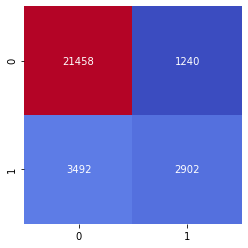

In [55]:
cf = confusion_matrix(y_test, y_pred)
sns.heatmap(cf, square=True, annot=True,
            fmt=".0f", cbar=False, cmap='coolwarm')
plt.show()

In [56]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.86      0.95      0.90     22698
           1       0.70      0.45      0.55      6394

    accuracy                           0.84     29092
   macro avg       0.78      0.70      0.73     29092
weighted avg       0.83      0.84      0.82     29092



## Random Forest Classifier

In [57]:
rf = RandomForestClassifier(n_estimators=150)
rf.fit(x_train, y_train.values.ravel())

RandomForestClassifier(n_estimators=150)

In [58]:
y_pred = rf.predict(x_test)

In [59]:
acc = accuracy_score(y_test, y_pred)
print(f'Accuracy: {acc*100}%')

Accuracy: 85.58022824144095%


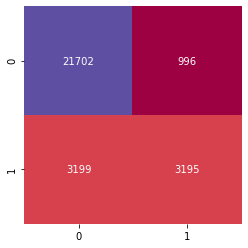

In [60]:
cf = confusion_matrix(y_test, y_pred)
sns.heatmap(cf, square=True, annot=True,
            fmt=".0f", cbar=False, cmap='Spectral')
plt.show()

In [61]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.87      0.96      0.91     22698
           1       0.76      0.50      0.60      6394

    accuracy                           0.86     29092
   macro avg       0.82      0.73      0.76     29092
weighted avg       0.85      0.86      0.84     29092



## Decision Tree Classifier

In [62]:
dt = DecisionTreeClassifier(random_state=0)
dt.fit(x_train, y_train)

DecisionTreeClassifier(random_state=0)

In [63]:
y_pred = dt.predict(x_test)

In [64]:
acc = accuracy_score(y_test, y_pred)
print(f'Accuracy: {acc*100}%')

Accuracy: 78.57142857142857%


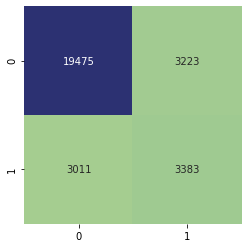

In [65]:
cf = confusion_matrix(y_test, y_pred)
sns.heatmap(cf, square=True, annot=True, fmt=".0f", cbar=False, cmap='crest')
plt.show()

In [66]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.87      0.86      0.86     22698
           1       0.51      0.53      0.52      6394

    accuracy                           0.79     29092
   macro avg       0.69      0.69      0.69     29092
weighted avg       0.79      0.79      0.79     29092



## Gradient Boosting Classifier

In [67]:
gb = GradientBoostingClassifier(random_state=0)
gb.fit(x_train, y_train.values.ravel())

GradientBoostingClassifier(random_state=0)

In [68]:
y_pred = gb.predict(x_test)

In [69]:
acc = accuracy_score(y_test, y_pred)
print(f'Accuracy: {acc*100}%')

Accuracy: 84.9546267014987%


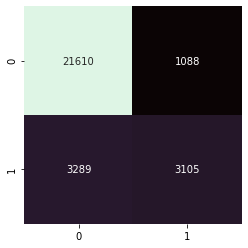

In [70]:
cf = confusion_matrix(y_test, y_pred)
sns.heatmap(cf, square=True, annot=True, fmt=".0f", cbar=False, cmap='mako')
plt.show()

In [71]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.87      0.95      0.91     22698
           1       0.74      0.49      0.59      6394

    accuracy                           0.85     29092
   macro avg       0.80      0.72      0.75     29092
weighted avg       0.84      0.85      0.84     29092



## Export Modified Datasets

In [72]:
df.to_csv("data/aus_clean_data.csv", index=False, header=True)

In [73]:
map_df.to_csv("data/aus_clean_map_data.csv", index=False, header=True)